In [0]:
from google.colab import drive
drive.mount('/drive')
%cd /drive/My Drive/data

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /drive
/drive/My Drive/data


In [0]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.transforms as vutils
import torchvision.utils as vutils

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

mySeed = 3734
print("seed:",mySeed)
random.seed(mySeed)
torch.manual_seed(mySeed)

seed: 3734


In [0]:
dataroot = 'ro/'
workers = 2 # dataloader 워커수
batch_size = 128 # 배치크기 논문과 동일
image_size=64 # 이것에 맞춰 리사이즈, center crop
nc = 3
nz = 100 # latent z의 크기 (G의 input)
ngf = 64 # G의 feature map 크기
ndf = 64 # D의 feature map 크기
num_epochs = 5
lr = 0.0002
beta1 = 0.5
beta2 = 0.999
ngpu = 1

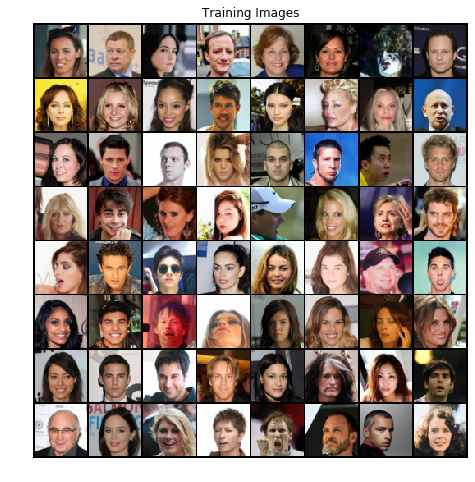

In [0]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                                                         transforms.Resize(image_size),
                                                         transforms.CenterCrop(image_size),
                                                         transforms.ToTensor(),
                                                         transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5)),
                           ]))
dataloader = torch.utils.data.DataLoader(dataset,batch_size=batch_size,
                                         shuffle=True,num_workers=workers)

device = torch.device('cuda' if (torch.cuda.is_available() and ngpu>0) else 'cpu')

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('Training Images')
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64],padding=2, normalize=True).cpu(),(1,2,0)))

In [0]:
def weights_init(m): # [4.]에 명시
  classname = m.__class__.__name__
  if classname.find('Conv')!=-1:
    nn.init.normal_(m.weight.data,0.0,0.02)
  elif classname.find('BatchNorm')!=-1:
    nn.init.normal_(m.weight.data,1.0,0.02)
    nn.init.constant_(m.bias.data,0)

In [0]:
class Generator(nn.Module):
  def __init__(self,ngpu):
    super(Generator, self).__init__()
    self.ngpu = ngpu
    self.main = nn.Sequential(
        nn.ConvTranspose2d(nz,ngf*8,4,1,0,bias=False),
        nn.BatchNorm2d(ngf*8),
        nn.ReLU(True),

        nn.ConvTranspose2d(ngf*8,ngf*4,4,2,1,bias=False),
        nn.BatchNorm2d(ngf*4),
        nn.ReLU(True),

        nn.ConvTranspose2d(ngf*4,ngf*2,4,2,1,bias=False),
        nn.BatchNorm2d(ngf*2),
        nn.ReLU(True),

        nn.ConvTranspose2d(ngf*2,ngf,4,2,1,bias=False),
        nn.BatchNorm2d(ngf),
        nn.ReLU(True),

        nn.ConvTranspose2d(ngf,nc,4,2,1,bias=False),
        nn.Tanh(),
    )
  def forward(self,input):
    return self.main(input)

In [68]:
G = Generator(ngpu).to(device)


#multi GPU라면, 이를 이용
if(device.type=='cuda') and (ngpu>1):
  G=nn.DataParallel(G,list(range(ngpu)))

#정의해둔 weights_init 함수를 이용하여, (0,0.2)로 가중치 초기화
G.apply(weights_init)

print(G)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


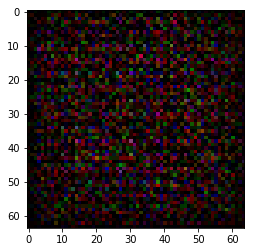

In [87]:
# Generator 테스트
noise = torch.randn(64,nz,1,1,device=device)
plt.imshow(G(noise).cpu().detach().numpy()[0].transpose(1,2,0))

In [0]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [90]:
D = Discriminator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    D = nn.DataParallel(D, list(range(ngpu)))

D.apply(weights_init)

print(D)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [0]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64 , nz, 1, 1, device=device)# 고정 노이즈. 학습과정에서 고정노이즈에 대한 generation을 기록하여 G의 generation 성능을 확인할 수 있음

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(D.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = optim.Adam(G.parameters(), lr=lr, betas=(beta1, beta2))

In [92]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        D.zero_grad()
        # Format batch
        real_data = data[0].to(device) # data 추출
        b_size = real_data.size(0)
        label = torch.full((b_size,), real_label, device=device) # size 만큼 real_label로 채우기 (학습데이터 추출)
        # Forward pass real batch through D
        output = D(real_data).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = G(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = D(fake.detach()).view(-1) # fake.detach를 통해 latent에 대한 backward는 계산하지 않는다.
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        G.zero_grad()
        label.fill_(real_label)  # fake데이터를 real label로 부여하여야 G에 대한 학습이 올바르게 진행.
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = D(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0: # 50 iter마다 로스 출력
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # 추후에 plot을 위해 loss를 기록
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # 고정 noise에 대해 G가 어떤이미지를 생성하는지 점검 500iter마다 출력하고 최종 결과물 출력(epoch== 마지막 에폭, i가 데이터로더 전체길이 )
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/313]	Loss_D: 1.6949	Loss_G: 2.6818	D(x): 0.3759	D(G(z)): 0.3495 / 0.0915
[0/5][50/313]	Loss_D: 0.1001	Loss_G: 14.4499	D(x): 0.9441	D(G(z)): 0.0005 / 0.0000
[0/5][100/313]	Loss_D: 0.3220	Loss_G: 10.2509	D(x): 0.8374	D(G(z)): 0.0002 / 0.0001
[0/5][150/313]	Loss_D: 0.5883	Loss_G: 7.9528	D(x): 0.9041	D(G(z)): 0.2565 / 0.0017
[0/5][200/313]	Loss_D: 0.2536	Loss_G: 3.0030	D(x): 0.9082	D(G(z)): 0.1193 / 0.0732
[0/5][250/313]	Loss_D: 0.7600	Loss_G: 6.8175	D(x): 0.9093	D(G(z)): 0.3956 / 0.0030
[0/5][300/313]	Loss_D: 0.4236	Loss_G: 3.3152	D(x): 0.9282	D(G(z)): 0.2499 / 0.0594
[1/5][0/313]	Loss_D: 1.0064	Loss_G: 7.6269	D(x): 0.9159	D(G(z)): 0.5294 / 0.0024
[1/5][50/313]	Loss_D: 0.8199	Loss_G: 4.0403	D(x): 0.8814	D(G(z)): 0.4125 / 0.0289
[1/5][100/313]	Loss_D: 1.4197	Loss_G: 8.0152	D(x): 0.9378	D(G(z)): 0.6571 / 0.0034
[1/5][150/313]	Loss_D: 0.7456	Loss_G: 3.3975	D(x): 0.6482	D(G(z)): 0.0562 / 0.0539
[1/5][200/313]	Loss_D: 0.8383	Loss_G: 2.8555	D(x): 0.5914	D(G(z))

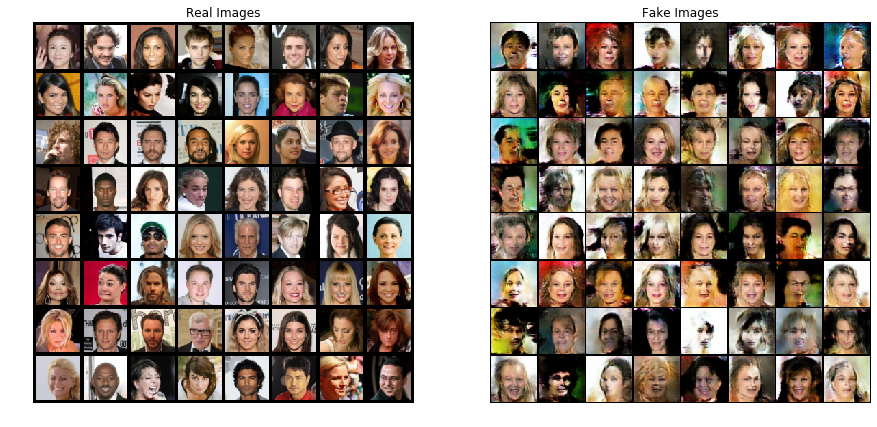

In [110]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [109]:
# Training Loop

# Lists to keep track of progress

print("Continue to Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        D.zero_grad()
        # Format batch
        real_data = data[0].to(device) # data 추출
        b_size = real_data.size(0)
        label = torch.full((b_size,), real_label, device=device) # size 만큼 real_label로 채우기 (학습데이터 추출)
        # Forward pass real batch through D
        output = D(real_data).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = G(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = D(fake.detach()).view(-1) # fake.detach를 통해 latent에 대한 backward는 계산하지 않는다.
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        G.zero_grad()
        label.fill_(real_label)  # fake데이터를 real label로 부여하여야 G에 대한 학습이 올바르게 진행.
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = D(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0: # 50 iter마다 로스 출력
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # 추후에 plot을 위해 loss를 기록
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # 고정 noise에 대해 G가 어떤이미지를 생성하는지 점검 500iter마다 출력하고 최종 결과물 출력(epoch== 마지막 에폭, i가 데이터로더 전체길이 )
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Continue to Training Loop...
[0/5][0/313]	Loss_D: 1.1550	Loss_G: 8.8547	D(x): 0.9479	D(G(z)): 0.5644 / 0.0003
[0/5][50/313]	Loss_D: 0.2759	Loss_G: 4.0018	D(x): 0.8541	D(G(z)): 0.0804 / 0.0332
[0/5][100/313]	Loss_D: 0.5172	Loss_G: 3.0214	D(x): 0.7133	D(G(z)): 0.0912 / 0.0938
[0/5][150/313]	Loss_D: 1.3891	Loss_G: 3.1361	D(x): 0.3777	D(G(z)): 0.0076 / 0.0921
[0/5][200/313]	Loss_D: 0.3571	Loss_G: 4.5851	D(x): 0.8666	D(G(z)): 0.1611 / 0.0165
[0/5][250/313]	Loss_D: 0.8653	Loss_G: 7.0447	D(x): 0.9411	D(G(z)): 0.5018 / 0.0017
[0/5][300/313]	Loss_D: 0.3362	Loss_G: 3.4701	D(x): 0.7788	D(G(z)): 0.0437 / 0.0476
[1/5][0/313]	Loss_D: 0.9867	Loss_G: 7.7152	D(x): 0.9499	D(G(z)): 0.5114 / 0.0012
[1/5][50/313]	Loss_D: 0.4943	Loss_G: 2.2643	D(x): 0.7526	D(G(z)): 0.1220 / 0.1501
[1/5][100/313]	Loss_D: 0.2937	Loss_G: 3.5096	D(x): 0.9074	D(G(z)): 0.1480 / 0.0496
[1/5][150/313]	Loss_D: 0.4102	Loss_G: 5.1579	D(x): 0.9102	D(G(z)): 0.2393 / 0.0097
[1/5][200/313]	Loss_D: 1.3261	Loss_G: 8.3735	D(x): 0.9423	D(G(z)

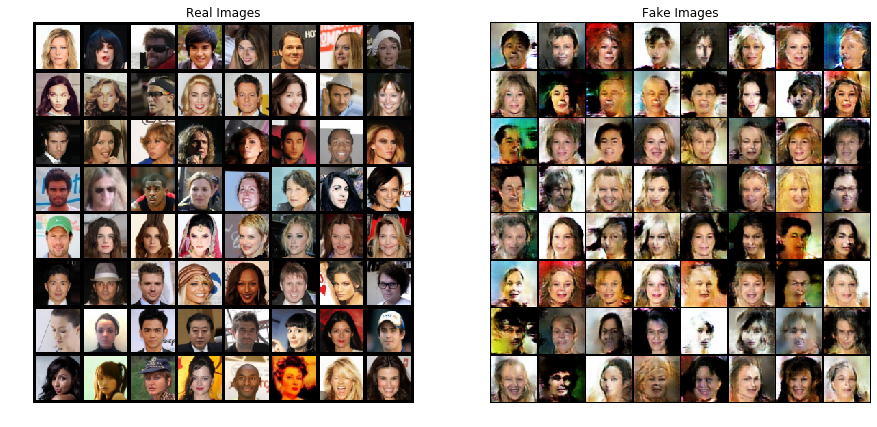

In [113]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [150]:
# Training Loop

# Lists to keep track of progress

print("Continue to Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        D.zero_grad()
        # Format batch
        real_data = data[0].to(device) # data 추출
        b_size = real_data.size(0)
        label = torch.full((b_size,), real_label, device=device) # size 만큼 real_label로 채우기 (학습데이터 추출)
        # Forward pass real batch through D
        output = D(real_data).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = G(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = D(fake.detach()).view(-1) # fake.detach를 통해 latent에 대한 backward는 계산하지 않는다.
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        G.zero_grad()
        label.fill_(real_label)  # fake데이터를 real label로 부여하여야 G에 대한 학습이 올바르게 진행.
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = D(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0: # 50 iter마다 로스 출력
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # 추후에 plot을 위해 loss를 기록
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # 고정 noise에 대해 G가 어떤이미지를 생성하는지 점검 500iter마다 출력하고 최종 결과물 출력(epoch== 마지막 에폭, i가 데이터로더 전체길이 )
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Continue to Training Loop...
[0/5][0/313]	Loss_D: 1.2670	Loss_G: 7.7796	D(x): 0.9805	D(G(z)): 0.6235 / 0.0011
[0/5][50/313]	Loss_D: 0.6001	Loss_G: 3.5827	D(x): 0.8142	D(G(z)): 0.2697 / 0.0429
[0/5][100/313]	Loss_D: 0.4485	Loss_G: 4.1651	D(x): 0.8729	D(G(z)): 0.2377 / 0.0238
[0/5][150/313]	Loss_D: 0.3862	Loss_G: 2.8694	D(x): 0.8072	D(G(z)): 0.1258 / 0.0848
[0/5][200/313]	Loss_D: 0.4595	Loss_G: 2.5693	D(x): 0.7868	D(G(z)): 0.1548 / 0.1113
[0/5][250/313]	Loss_D: 0.4515	Loss_G: 3.7653	D(x): 0.8714	D(G(z)): 0.2437 / 0.0324
[0/5][300/313]	Loss_D: 0.6557	Loss_G: 4.0163	D(x): 0.8372	D(G(z)): 0.3249 / 0.0282
[1/5][0/313]	Loss_D: 0.5823	Loss_G: 2.5323	D(x): 0.6630	D(G(z)): 0.0892 / 0.1284
[1/5][50/313]	Loss_D: 0.5879	Loss_G: 3.8435	D(x): 0.8924	D(G(z)): 0.3342 / 0.0322
[1/5][100/313]	Loss_D: 0.4052	Loss_G: 2.6702	D(x): 0.7989	D(G(z)): 0.1363 / 0.0905
[1/5][150/313]	Loss_D: 0.8526	Loss_G: 0.9947	D(x): 0.5064	D(G(z)): 0.0437 / 0.4230
[1/5][200/313]	Loss_D: 0.6432	Loss_G: 3.4582	D(x): 0.8439	D(G(z)

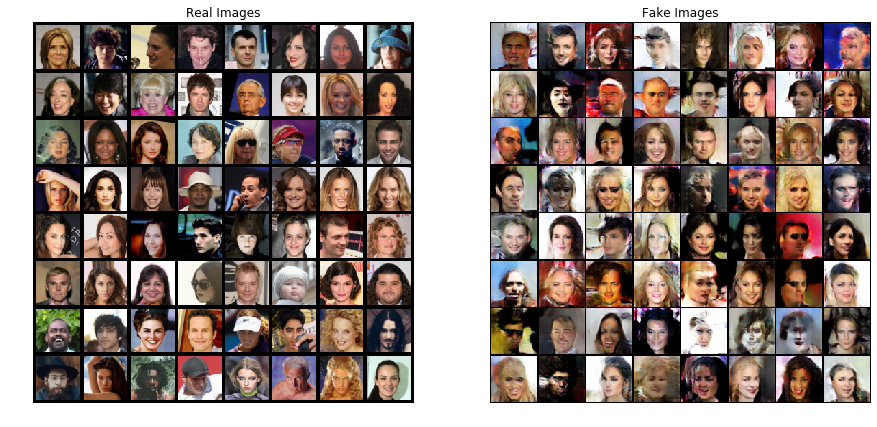

In [207]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [208]:
# Training Loop

# Lists to keep track of progress

print("Continue to Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        D.zero_grad()
        # Format batch
        real_data = data[0].to(device) # data 추출
        b_size = real_data.size(0)
        label = torch.full((b_size,), real_label, device=device) # size 만큼 real_label로 채우기 (학습데이터 추출)
        # Forward pass real batch through D
        output = D(real_data).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = G(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = D(fake.detach()).view(-1) # fake.detach를 통해 latent에 대한 backward는 계산하지 않는다.
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        G.zero_grad()
        label.fill_(real_label)  # fake데이터를 real label로 부여하여야 G에 대한 학습이 올바르게 진행. (G의 objective function은 D가 fake를 real로 분류하게 만드는데 있음.)
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = D(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0: # 50 iter마다 로스 출력
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # 추후에 plot을 위해 loss를 기록
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # 고정 noise에 대해 G가 어떤이미지를 생성하는지 점검 500iter마다 출력하고 최종 결과물 출력(epoch== 마지막 에폭, i가 데이터로더 전체길이 )
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Continue to Training Loop...
[0/5][0/313]	Loss_D: 1.1200	Loss_G: 1.1185	D(x): 0.4157	D(G(z)): 0.0374 / 0.4132
[0/5][50/313]	Loss_D: 0.4232	Loss_G: 2.7963	D(x): 0.8268	D(G(z)): 0.1858 / 0.0802
[0/5][100/313]	Loss_D: 1.2511	Loss_G: 1.0341	D(x): 0.3587	D(G(z)): 0.0323 / 0.4242
[0/5][150/313]	Loss_D: 0.4752	Loss_G: 3.5014	D(x): 0.9004	D(G(z)): 0.2814 / 0.0410
[0/5][200/313]	Loss_D: 0.6021	Loss_G: 1.9067	D(x): 0.7153	D(G(z)): 0.1880 / 0.1868
[0/5][250/313]	Loss_D: 0.5052	Loss_G: 2.8446	D(x): 0.8810	D(G(z)): 0.2931 / 0.0703
[0/5][300/313]	Loss_D: 0.6629	Loss_G: 2.1272	D(x): 0.6920	D(G(z)): 0.2031 / 0.1516
[1/5][0/313]	Loss_D: 0.5329	Loss_G: 1.8379	D(x): 0.7898	D(G(z)): 0.2066 / 0.2039
[1/5][50/313]	Loss_D: 0.4398	Loss_G: 2.6142	D(x): 0.8093	D(G(z)): 0.1836 / 0.0947
[1/5][100/313]	Loss_D: 0.5645	Loss_G: 2.9058	D(x): 0.8898	D(G(z)): 0.3128 / 0.0768
[1/5][150/313]	Loss_D: 0.5154	Loss_G: 2.5451	D(x): 0.7848	D(G(z)): 0.2024 / 0.0987
[1/5][200/313]	Loss_D: 0.8451	Loss_G: 1.8844	D(x): 0.5195	D(G(z)

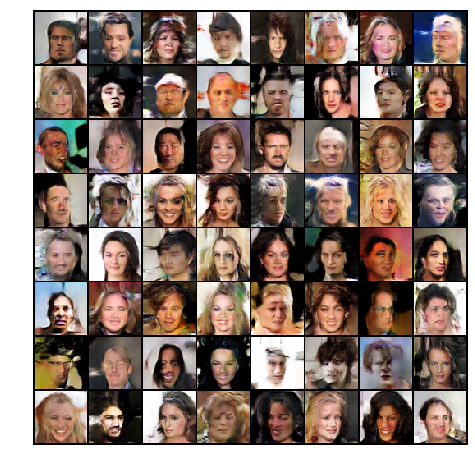

In [210]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

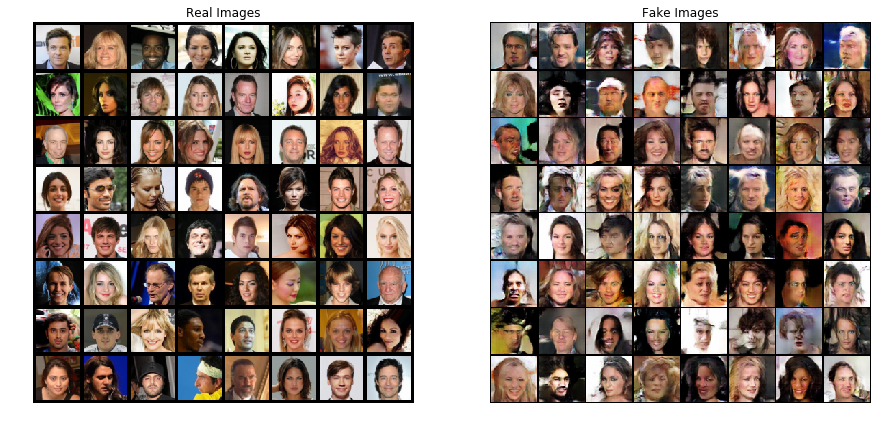

In [368]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [369]:
# Training Loop

# Lists to keep track of progress

print("Continue to Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        D.zero_grad()
        # Format batch
        real_data = data[0].to(device) # data 추출
        b_size = real_data.size(0)
        label = torch.full((b_size,), real_label, device=device) # size 만큼 real_label로 채우기 (학습데이터 추출)
        # Forward pass real batch through D
        output = D(real_data).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = G(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = D(fake.detach()).view(-1) # fake.detach를 통해 latent에 대한 backward는 계산하지 않는다.
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        G.zero_grad()
        label.fill_(real_label)  # fake데이터를 real label로 부여하여야 G에 대한 학습이 올바르게 진행. (G의 objective function은 D가 fake를 real로 분류하게 만드는데 있음.)
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = D(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0: # 50 iter마다 로스 출력
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # 추후에 plot을 위해 loss를 기록
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # 고정 noise에 대해 G가 어떤이미지를 생성하는지 점검 500iter마다 출력하고 최종 결과물 출력(epoch== 마지막 에폭, i가 데이터로더 전체길이 )
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Continue to Training Loop...
[0/5][0/313]	Loss_D: 0.5236	Loss_G: 2.4854	D(x): 0.7899	D(G(z)): 0.1936 / 0.1179
[0/5][50/313]	Loss_D: 0.5697	Loss_G: 1.5946	D(x): 0.6835	D(G(z)): 0.1254 / 0.2440
[0/5][100/313]	Loss_D: 0.6328	Loss_G: 2.1342	D(x): 0.7521	D(G(z)): 0.2384 / 0.1609
[0/5][150/313]	Loss_D: 0.4762	Loss_G: 1.8448	D(x): 0.7065	D(G(z)): 0.0859 / 0.1954
[0/5][200/313]	Loss_D: 0.6140	Loss_G: 1.5853	D(x): 0.6891	D(G(z)): 0.1570 / 0.2551
[0/5][250/313]	Loss_D: 0.5688	Loss_G: 2.5707	D(x): 0.7933	D(G(z)): 0.2521 / 0.0938
[0/5][300/313]	Loss_D: 0.8097	Loss_G: 3.5791	D(x): 0.8502	D(G(z)): 0.4175 / 0.0395
[1/5][0/313]	Loss_D: 0.9464	Loss_G: 4.1439	D(x): 0.9310	D(G(z)): 0.5244 / 0.0258
[1/5][50/313]	Loss_D: 0.4888	Loss_G: 3.1544	D(x): 0.8695	D(G(z)): 0.2666 / 0.0562
[1/5][100/313]	Loss_D: 0.7408	Loss_G: 1.3604	D(x): 0.5549	D(G(z)): 0.0717 / 0.3179
[1/5][150/313]	Loss_D: 0.9493	Loss_G: 5.0858	D(x): 0.9497	D(G(z)): 0.5374 / 0.0087
[1/5][200/313]	Loss_D: 0.6914	Loss_G: 4.1310	D(x): 0.9071	D(G(z)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


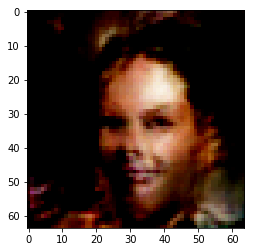

In [114]:
# Generator 테스트 5 Epochs
noise = torch.randn(64,nz,1,1,device=device)
plt.imshow(G(noise).cpu().detach().numpy()[0].transpose(1,2,0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


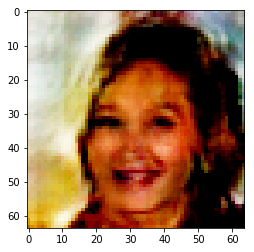

In [149]:
# Generator 테스트 10 Epochs
noise = torch.randn(64,nz,1,1,device=device)
plt.imshow(G(noise).cpu().detach().numpy()[0].transpose(1,2,0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


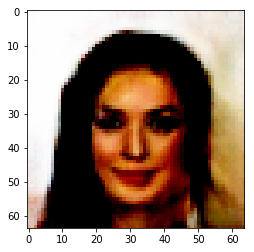

In [205]:
# Generator 테스트 15 Epochs
noise = torch.randn(64,nz,1,1,device=device)
plt.imshow(G(noise).cpu().detach().numpy()[0].transpose(1,2,0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


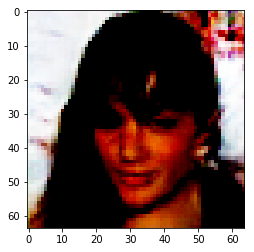

In [211]:
# Generator 테스트 15 Epochs
noise = torch.randn(64,nz,1,1,device=device)
plt.imshow(G(noise).cpu().detach().numpy()[0].transpose(1,2,0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


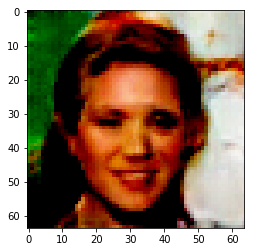

In [236]:
# Generator 테스트 20 Epochs
noise = torch.randn(64,nz,1,1,device=device)
plt.imshow(G(noise).cpu().detach().numpy()[0].transpose(1,2,0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


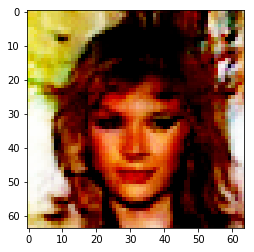

In [307]:
# Generator 테스트 20 Epochs
noise = torch.randn(64,nz,1,1,device=device)
plt.imshow(G(noise).cpu().detach().numpy()[0].transpose(1,2,0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


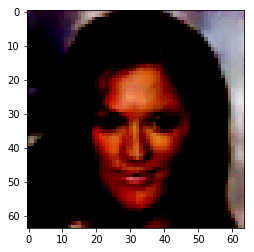

In [367]:
# Generator 테스트 20 Epochs
noise = torch.randn(64,nz,1,1,device=device)
plt.imshow(G(noise).cpu().detach().numpy()[0].transpose(1,2,0))

In [0]:
ani.save('im.mp4')

In [381]:
!sudo apt-get install imagemagick

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono ghostscript gsfonts
  imagemagick-6-common imagemagick-6.q16 libcupsfilters1 libcupsimage2
  libdjvulibre-text libdjvulibre21 libgs9 libgs9-common libijs-0.35
  libjbig2dec0 liblqr-1-0 libmagickcore-6.q16-3 libmagickcore-6.q16-3-extra
  libmagickwand-6.q16-3 libnetpbm10 libwmf0.2-7 netpbm poppler-data
Suggested packages:
  fonts-noto ghostscript-x imagemagick-doc autotrace cups-bsd | lpr | lprng
  enscript gimp gnuplot grads hp2xx html2ps libwmf-bin mplayer povray radiance
  sane-utils texlive-base-bin transfig ufraw-batch inkscape libjxr-tools
  libwmf0.2-7-gtk poppler-utils fonts-japanese-mincho | fonts-ipafont-mincho
  fonts-japanese-gothic | fonts-ipafont-goth

In [384]:
ani.save('im2fps.gif', writer='imagemagick', fps=2, dpi=100)

MovieWriter imagemagick unavailable. Trying to use pillow instead.
